<a href="https://colab.research.google.com/github/victoriaporter58/Facial_Weakness_Identification_for_Stroke_Prediction/blob/main/instance_segmentation_with_multi_class_custom_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Instance Segmentation in Google Colab with a Multi-Class Custom Dataset

Train a model on a custom dataset containing 6 classes.

**Dataset**: 'train' and 'val' folders each containing .jpg images and 'via_region_data.json' file containing annotations.

Created by Victoria Porter

##Downgrade Keras
Keras 2.3.1 causes issues during training whereas version 2.2.5 works perfectly. Restart runtime after executing this line.

In [ ]:
!pip install keras==2.2.5

##Select Tensorflow version

In [ ]:
!pip install tensorflow==1.15.0rc2

## Uninstall then reinstall imgaug library to correct versioning

In [ ]:
pip uninstall imgaug

In [ ]:
pip install imgaug

##Install MRCNN package

In [ ]:
!pip install mrcnn

##Import Your Drive


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

##Make project folder the current working directory

In [ ]:
%cd /content/gdrive/My Drive/Facial_Weakness_Project/New model

##Clone github repository into project_folder

In [ ]:
! git clone https://github.com/victoriaporter58/Mask_RCNN.git

##Run setup.py

In [ ]:
%cd /content/gdrive/My Drive/Facial_Weakness_Project/Mask_RCNN
!python setup.py install

##Extract train data

In [ ]:
%cd /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions


# download train.zip and save in google drive - replace ID below with your specific one
fileId = '1lF6xHtUrNFm4k1jRSCmsml-qrm8BMgX9'

import os
from zipfile import ZipFile
from shutil import copy
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

os.makedirs('dataset')
os.chdir('dataset')

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

fileName = fileId + '.zip'
downloaded = drive.CreateFile({'id': fileId})
downloaded.GetContentFile(fileName)
ds = ZipFile(fileName)
ds.extractall()
os.remove(fileName)
print('Extracted zip file ' + fileName)

##Extract val data

In [ ]:
%cd /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions

# download val.zip and save in google drive - replace ID below with your specific one
fileId = '1_wrYRt033x7CsYUj1hBqRlOe0gWle6_v'

import os
from zipfile import ZipFile
from shutil import copy
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

os.chdir('dataset')

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

fileName = fileId + '.zip'
downloaded = drive.CreateFile({'id': fileId})
downloaded.GetContentFile(fileName)
ds = ZipFile(fileName)
ds.extractall()
os.remove(fileName)
print('Extracted zip file ' + fileName)

##Train model

In [ ]:
# pull potential file updates from github
!git pull

In [ ]:
%cd /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions

!python regions.py train --dataset=dataset/ --weights=coco

/content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions
Using TensorFlow backend.
coco weights path:  /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/mask_rcnn_coco.h5
Weights:  last
Dataset:  dataset/
Logs:  /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/logs

Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                19
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE           

##Visualise ground truth data before running inference test

In [ ]:
image_id = 19 #enter any number within the dataset limits
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)

# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)

# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names,show_mask=False, show_bbox=True)

##Set-up inference test

In [ ]:
%cd /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions

import os
import cv2
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage
import glob
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import regions

# Root directory of the project
ROOT_DIR = os.getcwd()

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

custom_WEIGHTS_PATH = "/content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/logs/regions20201104T1354/mask_rcnn_regions_0150.h5"

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

config = regions.CustomConfig()
custom_DIR = os.path.join(ROOT_DIR, "dataset")

class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.7

config = InferenceConfig()
config.display()

# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax
  
# Load validation dataset
dataset = regions.CustomDataset()
dataset.load_custom(custom_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

# Load weights
print("Loading weights ", custom_WEIGHTS_PATH)
model.load_weights(custom_WEIGHTS_PATH, by_name=True)

from importlib import reload # was constantly changin the visualization, so I decided to reload it instead of notebook
reload(visualize)

##Run inference test

image ID: regions.face_181.jpg (0) /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions/dataset/val/face_181.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  190.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:   84.10000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


gt_class_id              shape: (6,)                  min:    1.00000  max:    6.00000  int32
gt_bbox                  shape: (6, 4)                min:  349.00000  max:  854.00000  int32
gt_mask                  shape: (1024, 1024, 6)       min:    0.00000  max:    1.00000  bool
image ID: regions.face_182.jpg (1) /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions/dataset/val/face_182.jpg
Processing 1 images
image  

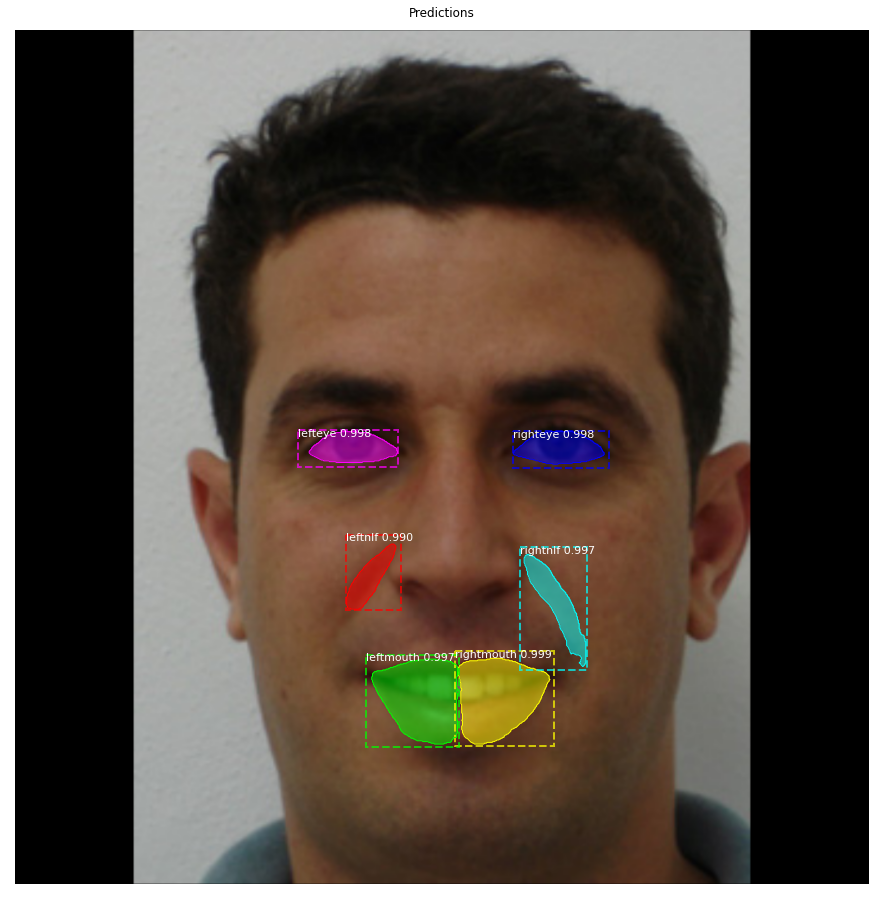

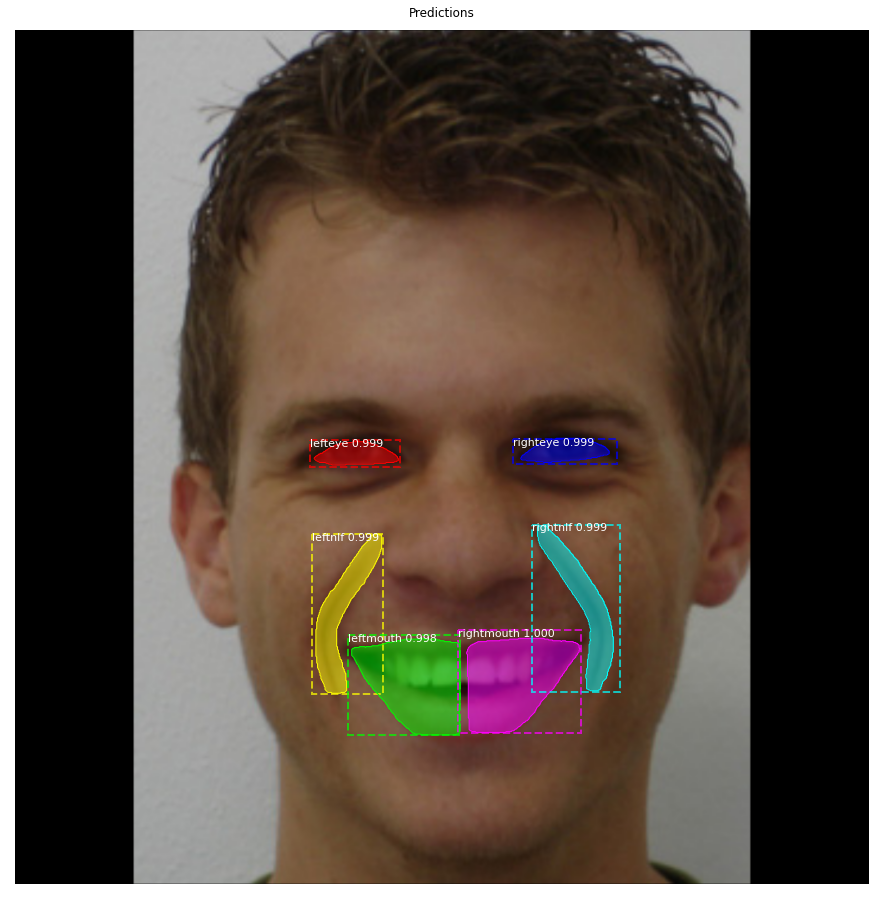

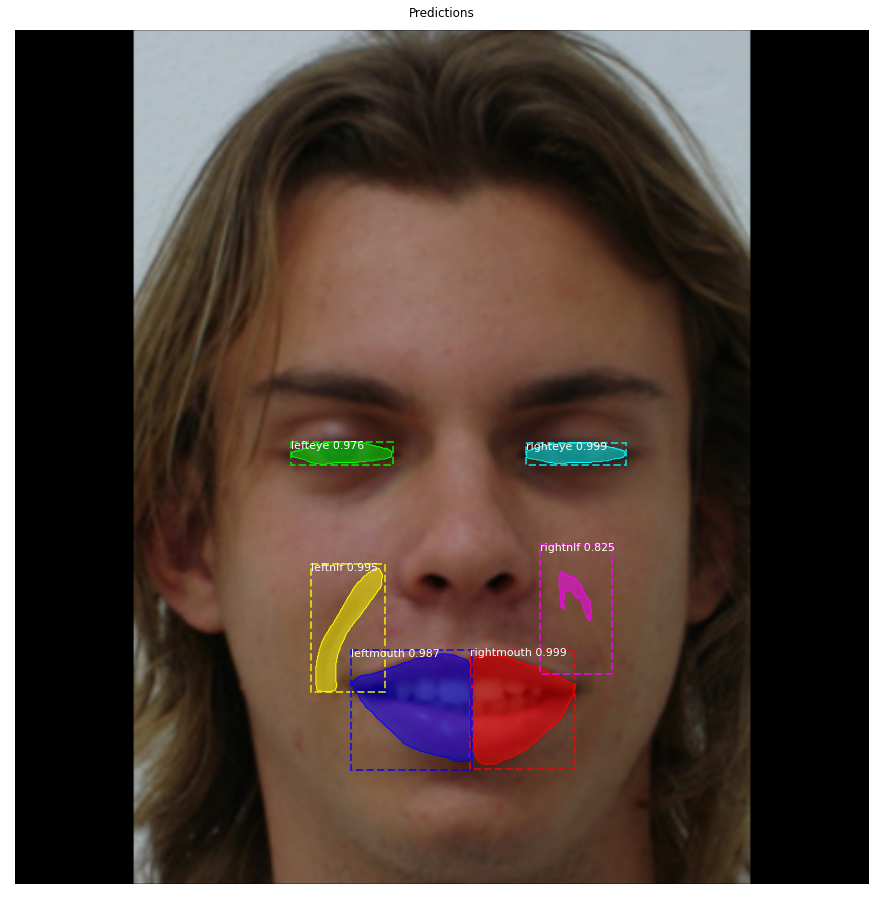

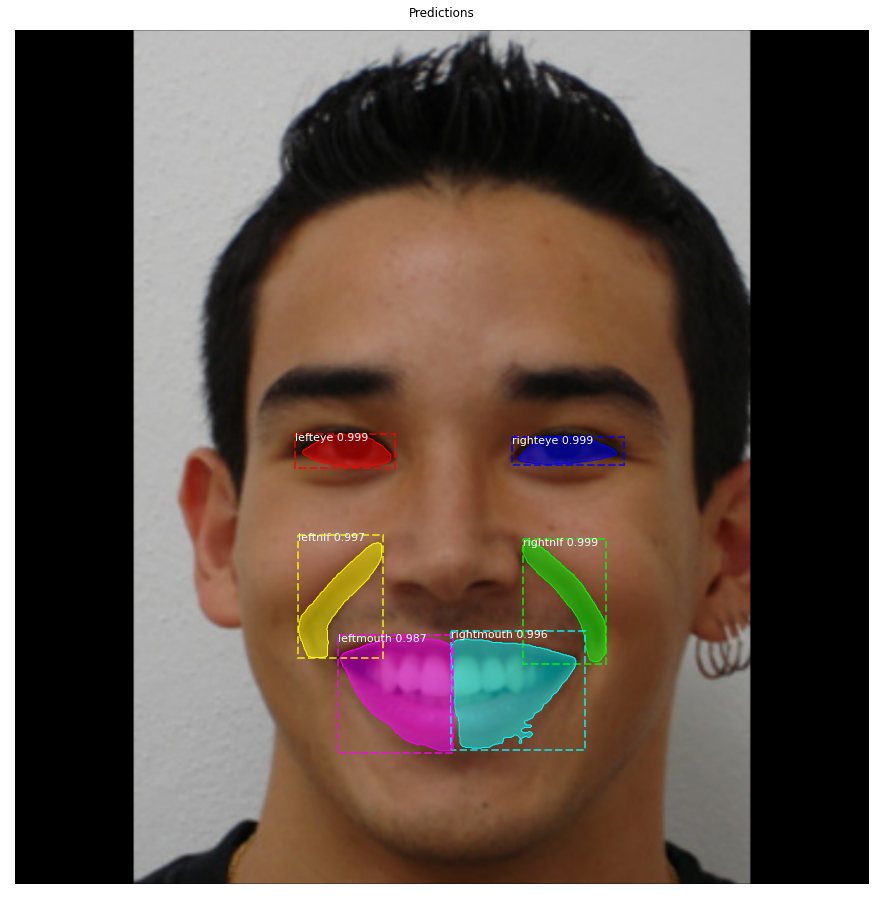

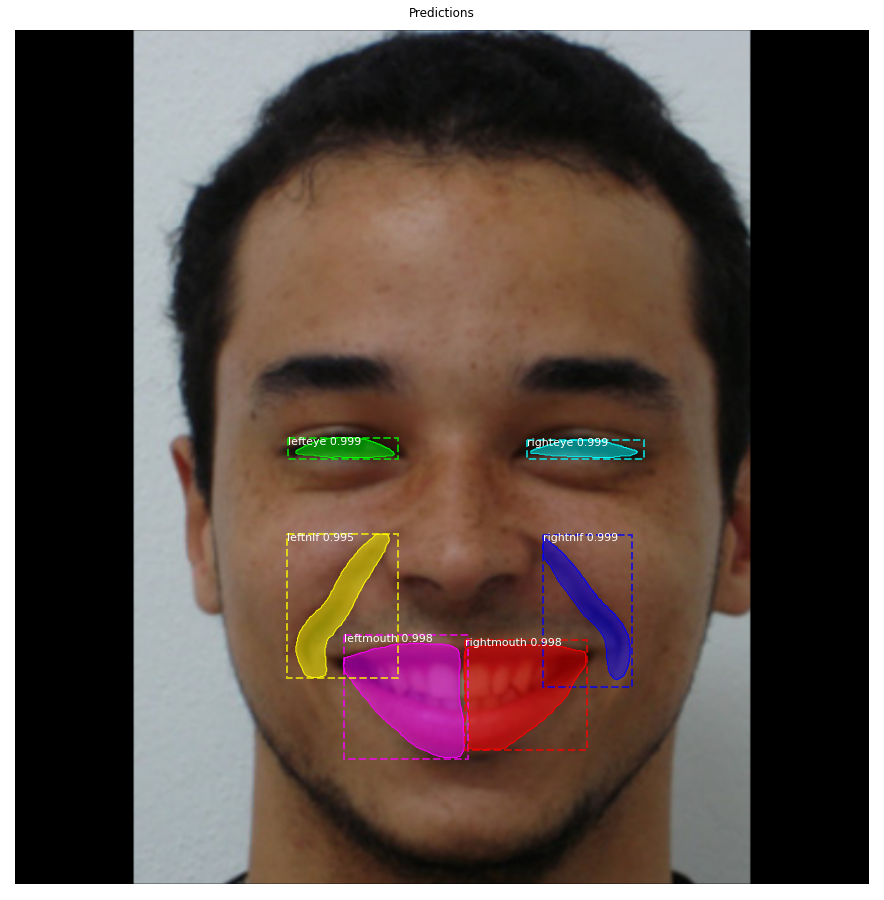

...

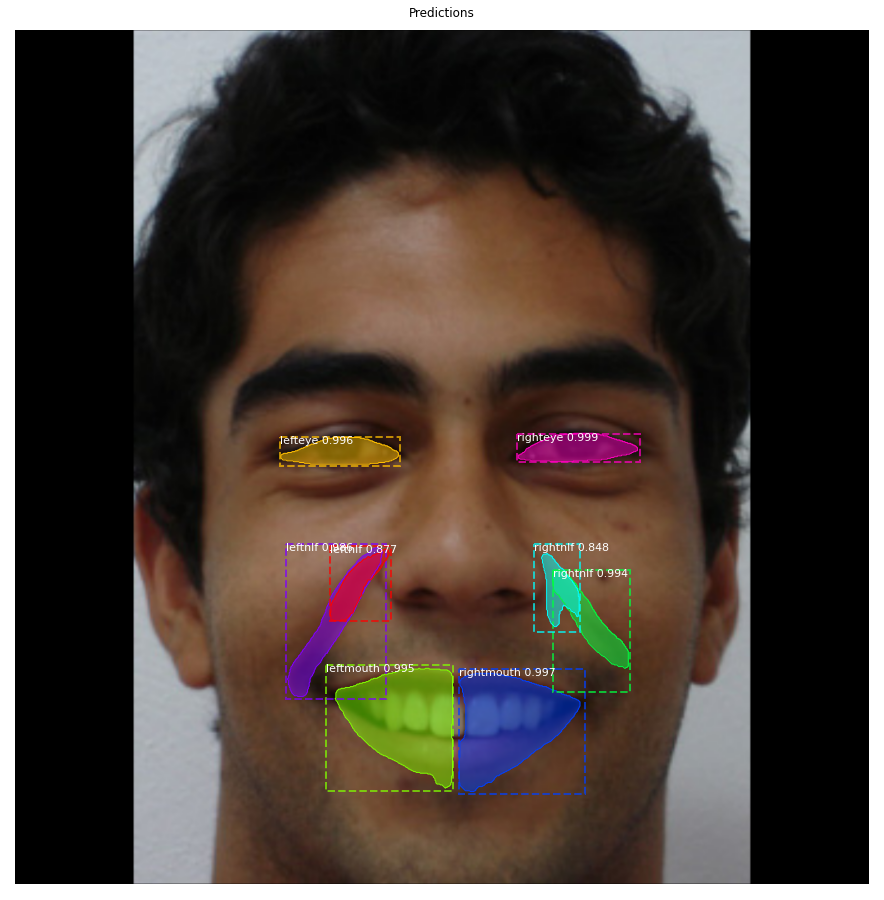

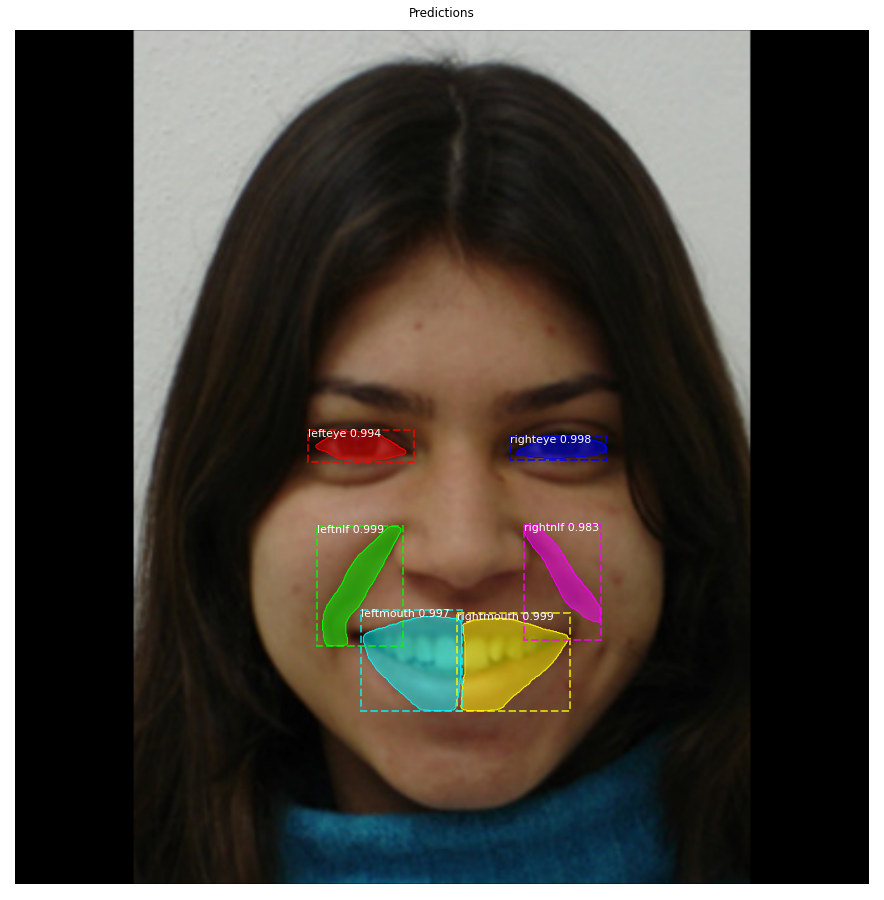

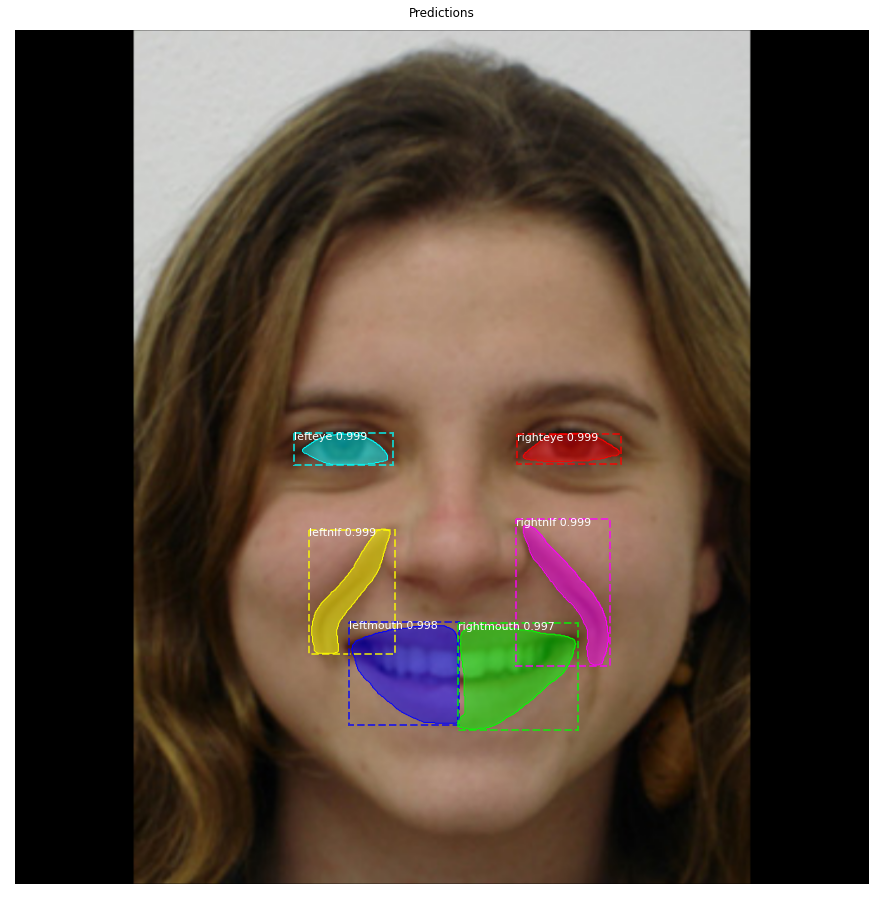

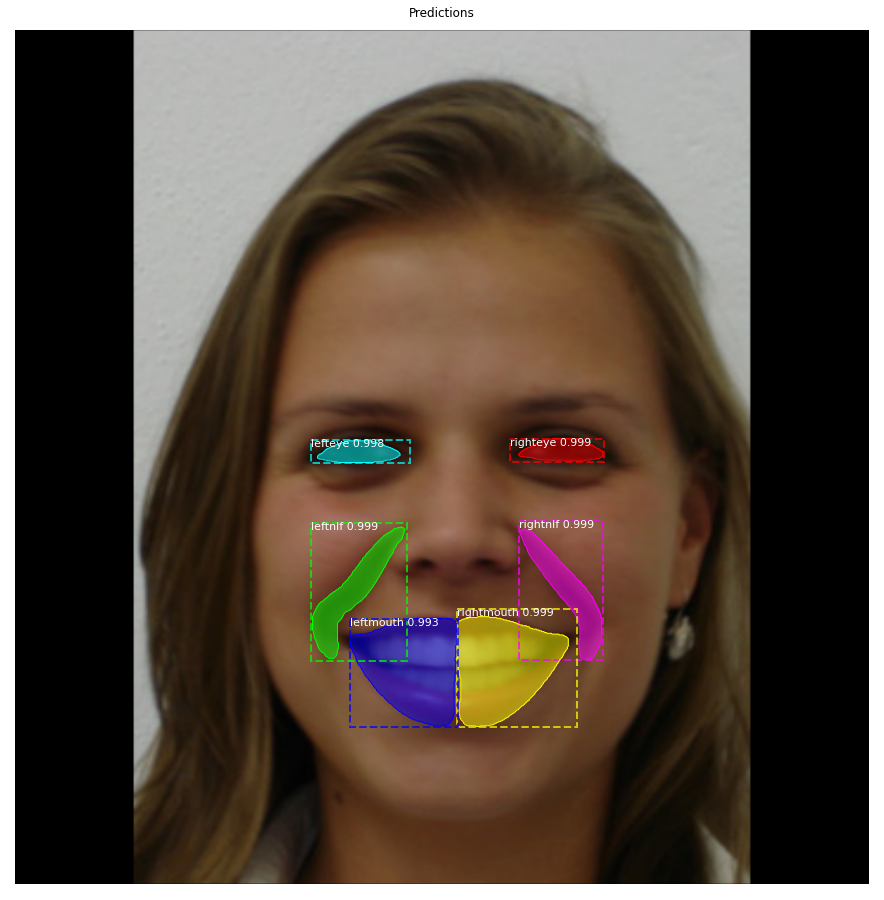

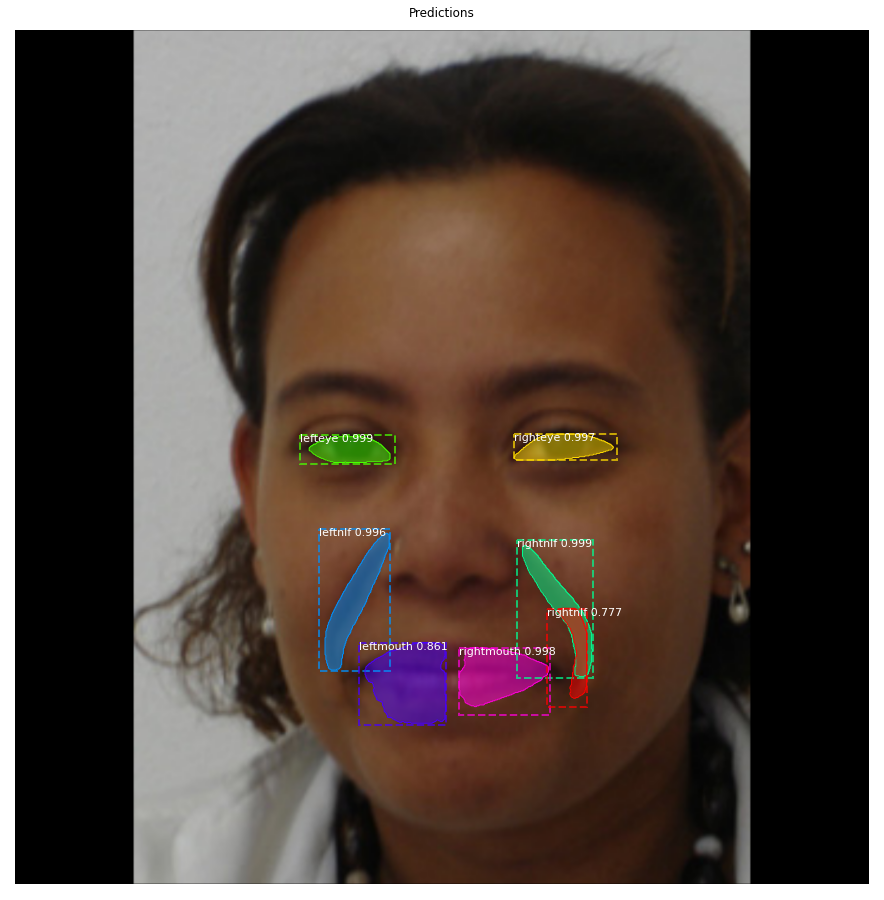

In [ ]:
for image_id in dataset.image_ids:
  image, image_meta, gt_class_id, gt_bbox, gt_mask =\
      modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
  info = dataset.image_info[image_id]
  print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                         dataset.image_reference(image_id)))

  # Run object detection
  results = model.detect([image], verbose=1)

  # Display results
  ax = get_ax(1)
  r = results[0]
  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                              dataset.class_names, r['scores'], ax=ax,
                              title="Predictions")
  
  print ('\n')
  log("gt_class_id", gt_class_id)
  log("gt_bbox", gt_bbox)
  log("gt_mask", gt_mask)

##Visualise Mask IoU

image ID: regions.Copy of G42.jpg (0) /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions/dataset/val/Copy of G42.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (6,)                  min:    1.00000  max:    6.00000  int32
gt_bbox                  shape: (6, 4)                min:  265.00000  max:  775.00000  int32
gt_mask                  shape: (1024, 1024, 6)       min:    0.00000  max:    1.00000  bool
image ID: regions.Copy_of_A05-removebg-preview.png (1) /content/gdrive/My Drive/Facial_Weakness_Project/New model/Mask_RCNN/samples/regions/dataset/val/Copy_of_A05-remo

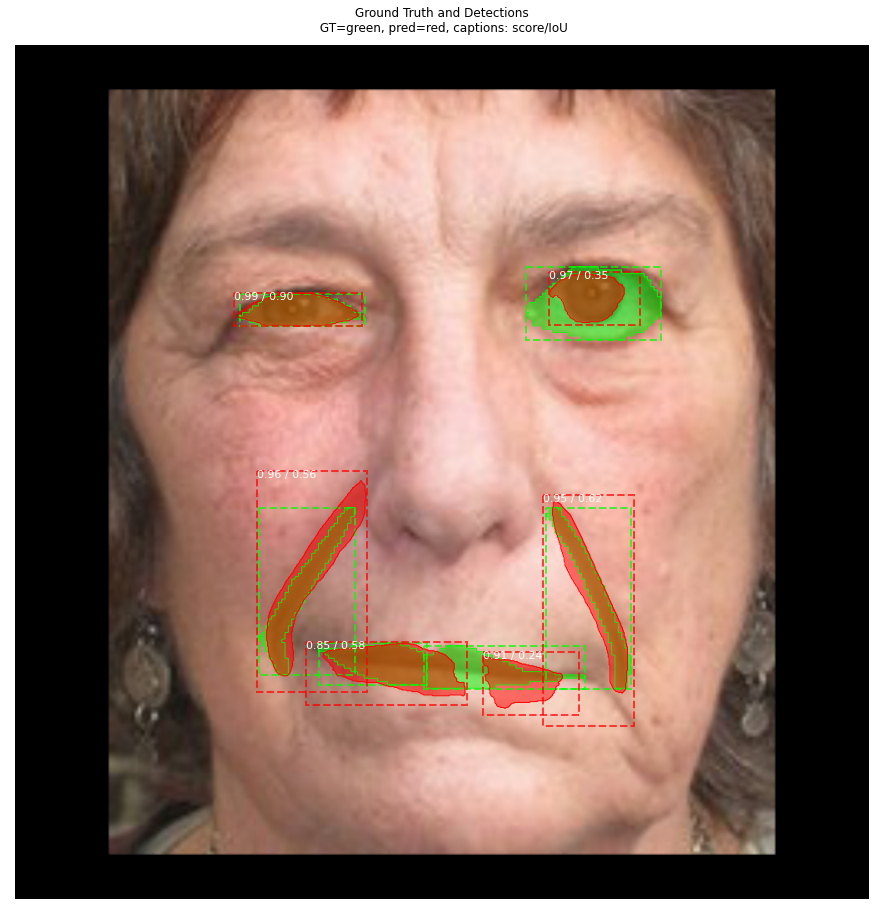

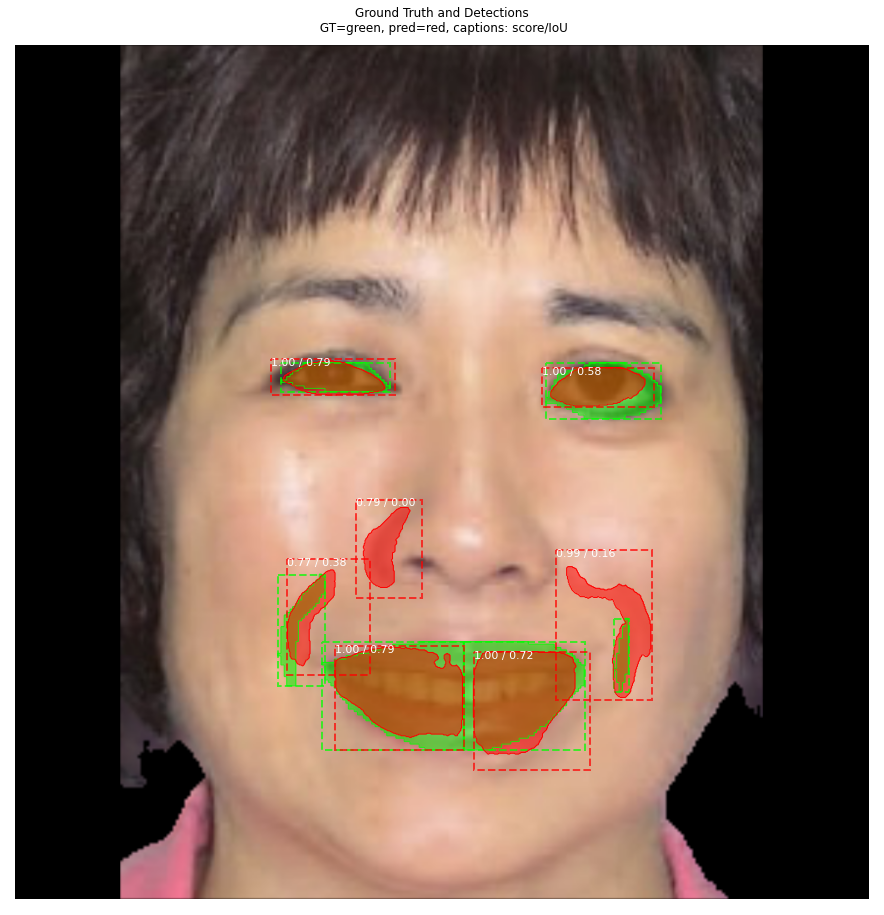

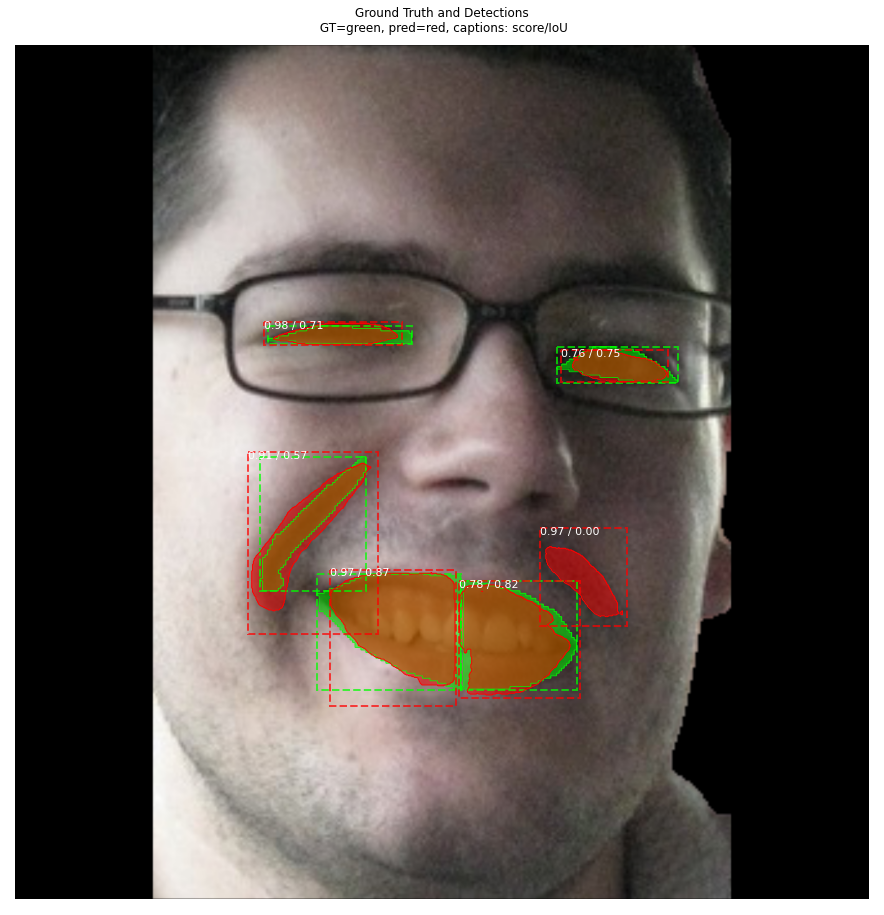

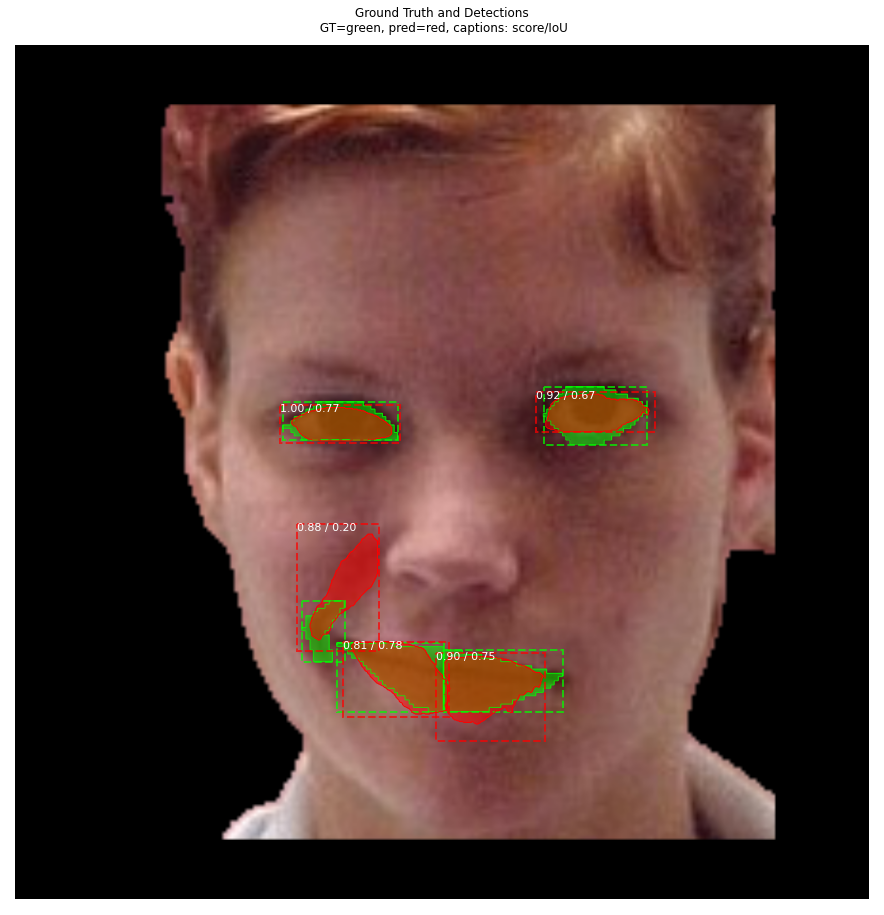

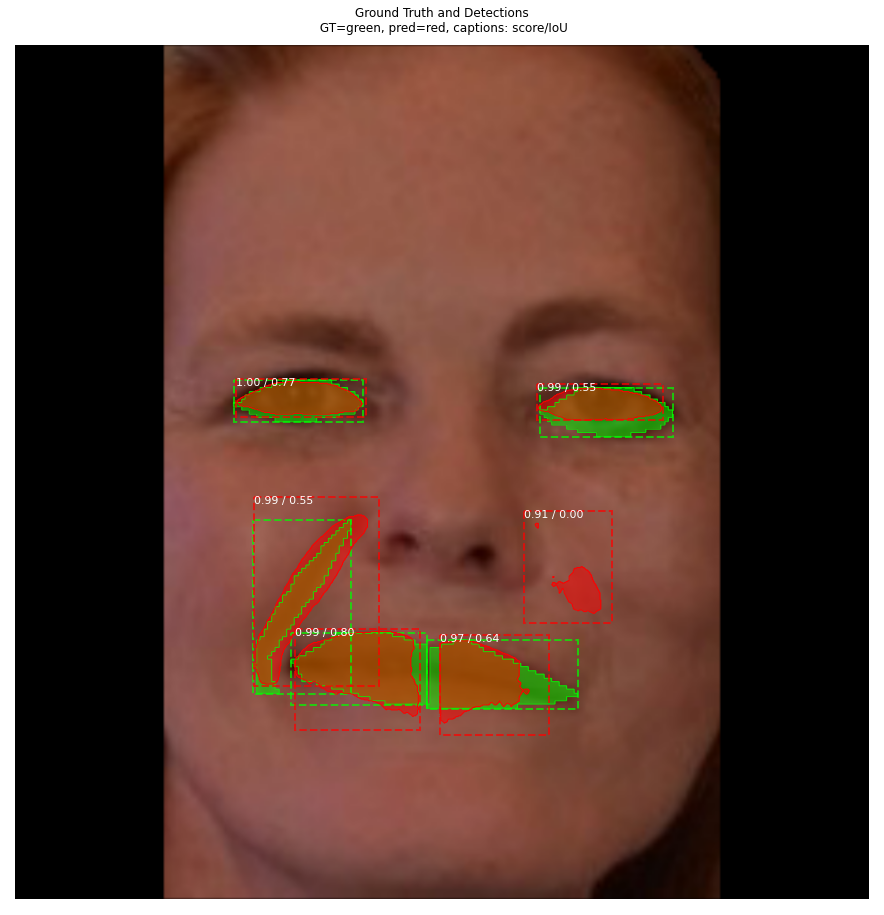

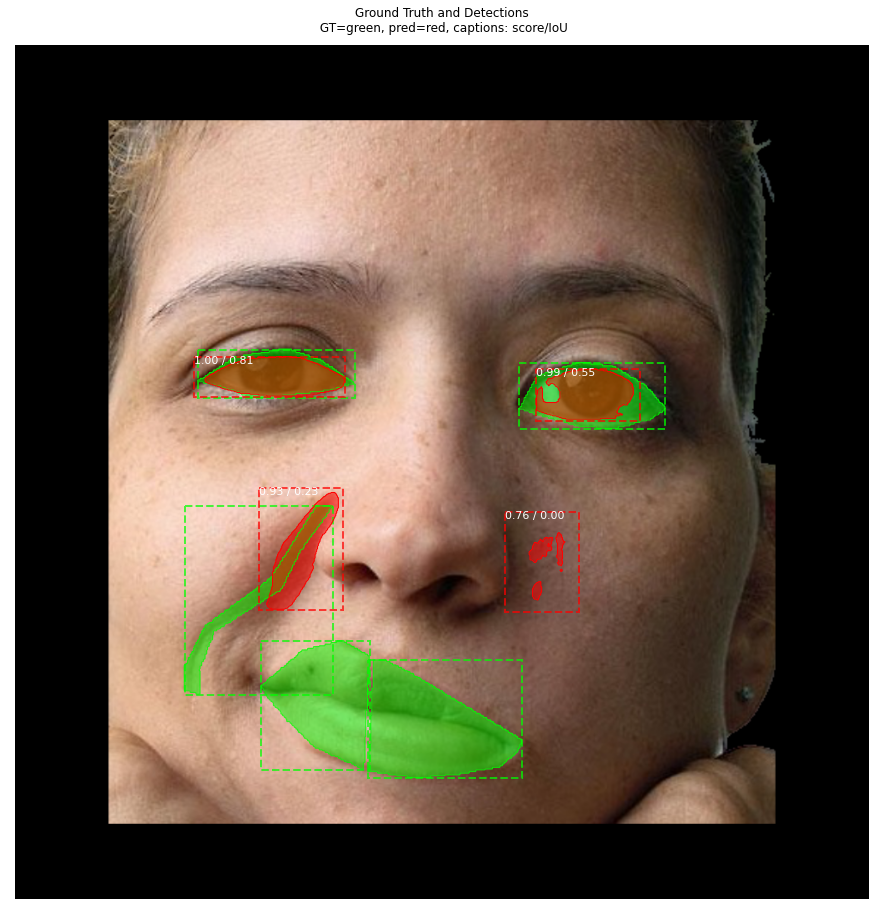

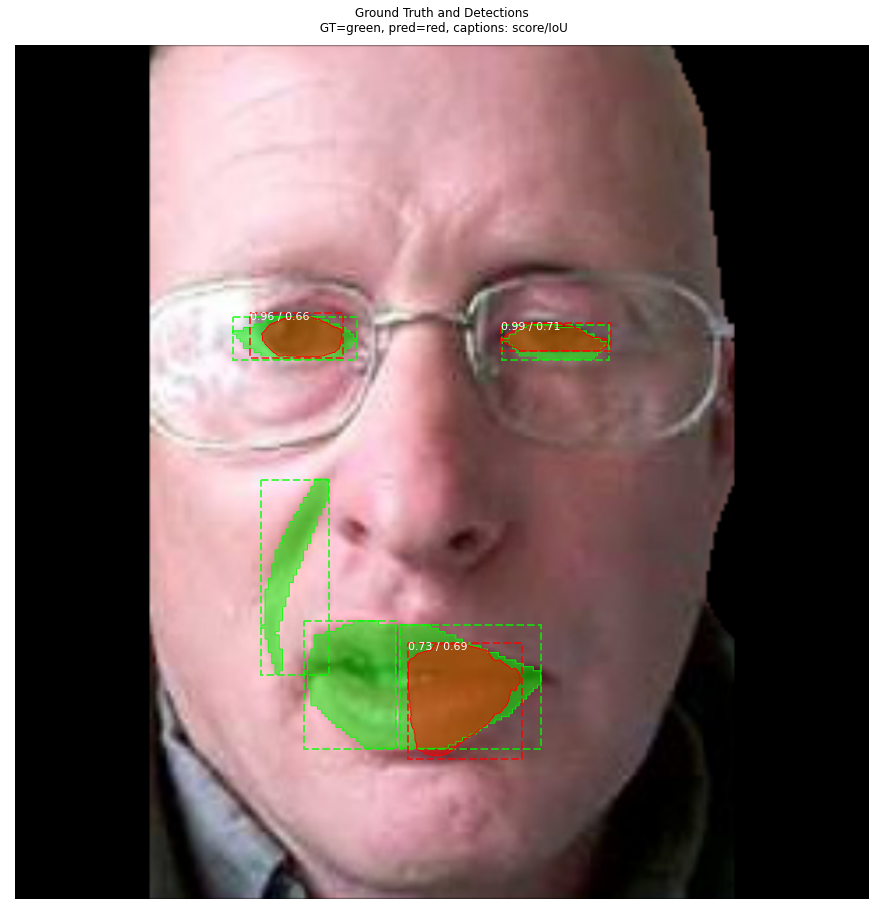

In [ ]:
#image_id = random.choice(dataset.image_ids)
for image_id in dataset.image_ids:
  image, image_meta, gt_class_id, gt_bbox, gt_mask =\
      modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
  info = dataset.image_info[image_id]
  print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                         dataset.image_reference(image_id)))

  results = model.detect([image], verbose=1)

  ax = get_ax(1)
  r = results[0]
  
  visualize.display_differences(image, gt_bbox, gt_class_id, gt_mask, r['rois'], r['class_ids'],r['scores'],r['masks'],
                                dataset.class_names,ax=ax)
                        
  log("gt_class_id", gt_class_id)
  log("gt_bbox", gt_bbox)
  log("gt_mask", gt_mask)